# TRABAJO PRÁCTICO Nº 4

**Alumnos:**
- Nahuel Arrieta
- Lucas moyano

In [69]:
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [70]:
def read_image(image_name):
  image_path = "./images/" + image_name

  # Read the image
  image = cv2.imread(image_path)
  if image is None:
    sys.exit("Could not read the image " + image_path)
  return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [71]:
def show_image(label, image):
  ## Create a plot
  plt.imshow(image, cmap='gray')
  plt.title(label)
  plt.axis('off')
  plt.show()

## Sección 1: Transformada de Fourier

### 11. Transformada de Fourier inversa: Realiza la transformada de Fourier inversa para recuperar la imagen original a partir de su versi´on filtrada en el dominio frecuencial. Compara la imagen original con la imagen recuperada.

In [72]:
def fourier_transform(image, shift=True):
    ## Convert to grayscale
    if len(image.shape) == 3:
        # Convert to grayscale if the image is in color
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    ## Apply Fourier Transform
    f_transform = np.fft.fft2(image)

    ## Shift the zero frequency component to the center
    if shift:
        f_transform = np.fft.fftshift(f_transform)

    ## Calculate the magnitude spectrum
    magnitude = np.abs(f_transform)

    ## Calculate the phase spectrum
    phase = np.angle(f_transform)
    
    return magnitude, phase

In [73]:
def plot_fourier(label, magnitude, phase):
    if magnitude is not None:
        magnitude = np.log(1 + magnitude)
        magnitude = np.uint8(magnitude)
        show_image("Magnitude Spectrum " + label, magnitude)

    if phase is not None:
        phase = (phase + np.pi) / (2 * np.pi) * 255
        phase = np.uint8(phase)
        show_image("Phase Spectrum " + label, phase)

In [74]:
def inverse_fourier_transform(magnitude, phase):
    # Reconstruct the complex spectrum
    f_reconstructed = magnitude * np.exp(1j * phase)

    # Shift the zero frequency component back to the original position
    f_reconstructed = np.fft.ifftshift(f_reconstructed)

    # Apply inverse Fourier Transform
    image_reconstructed_complex = np.fft.ifft2(f_reconstructed)

    # Get the real part (or absolute value)
    image_reconstructed = np.abs(image_reconstructed_complex)

    # Normalize the image to the range [0, 255]
    image_reconstructed = cv2.normalize(image_reconstructed, None, 0, 255, cv2.NORM_MINMAX)

    return np.uint8(image_reconstructed)


#### (a) ¿Como se visualiza la diferencia entre las frecuencias altas y bajas en una imagen? Ejercicio sugerido: Aplicar la Transformada de Fourier (DFT) y mostrar la magnitud del espectro centrado con fftshift.

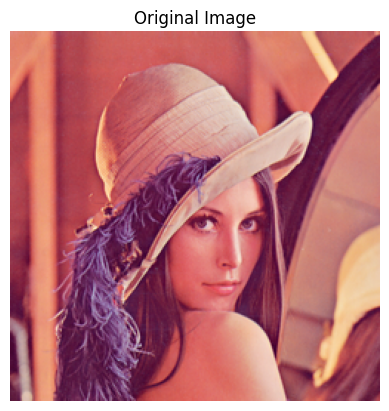

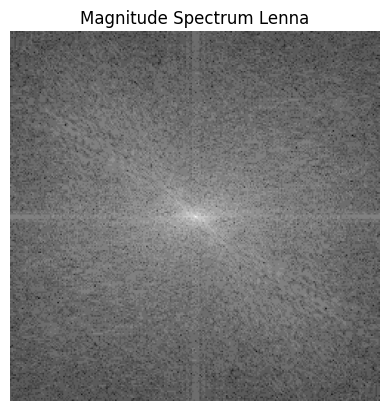

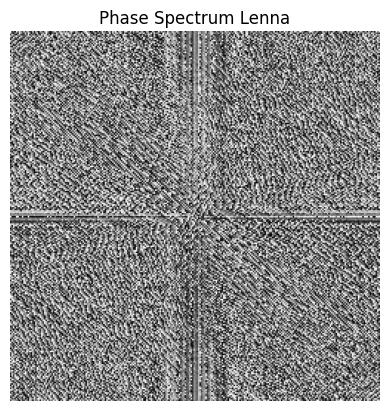

In [75]:
image = read_image("Lenna.png")
magnitude, phase = fourier_transform(image)
show_image("Original Image", image)
plot_fourier("Lenna", magnitude, phase)

#### (b) ¿Que ocurre si eliminamos las componentes de alta frecuencia de una imagen? ¿Y si eliminamos las de baja frecuencia? Ejercicio sugerido: Aplicar filtros pasa bajos y pasa altos en el dominio de la frecuencia y reconstruir la imagen con la transformada inversa.

In [76]:
def ideal_low_pass_filter(magnitude, cutoff):
    # Create a mask with the same shape as the magnitude spectrum
    rows, cols = magnitude.shape
    center_row, center_col = rows // 2, cols // 2
    y, x = np.ogrid[:rows, :cols]
    mask = (x - center_col) ** 2 + (y - center_row) ** 2 <= cutoff ** 2

    # Apply the mask to the magnitude spectrum
    filtered_magnitude = magnitude * mask

    return filtered_magnitude


In [77]:
def ideal_high_pass_filter(magnitude, cutoff):
    # Create a mask with the same shape as the magnitude spectrum
    rows, cols = magnitude.shape
    center_row, center_col = rows // 2, cols // 2
    y, x = np.ogrid[:rows, :cols]
    mask = (x - center_col) ** 2 + (y - center_row) ** 2 >= cutoff ** 2

    # Apply the mask to the magnitude spectrum
    filtered_magnitude = magnitude * mask

    return filtered_magnitude

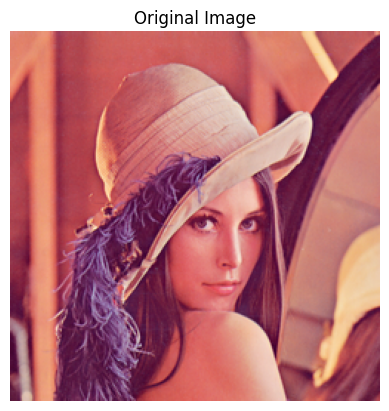

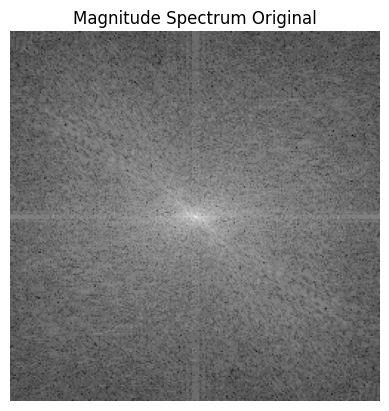

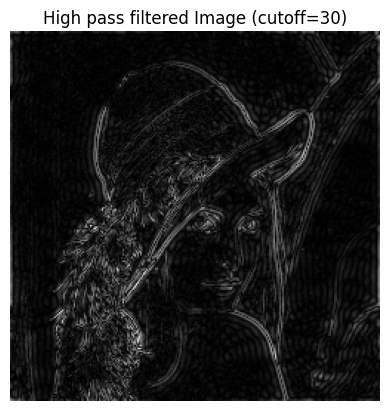

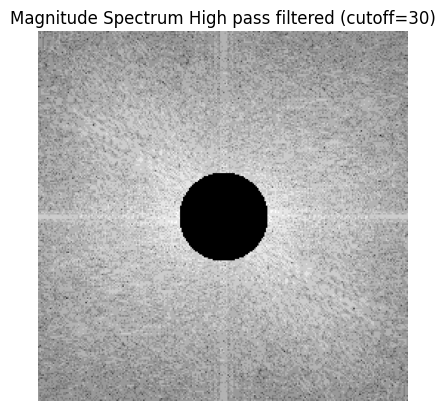

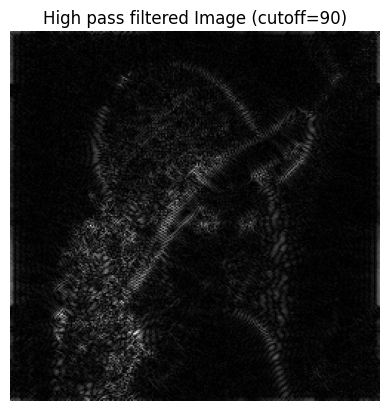

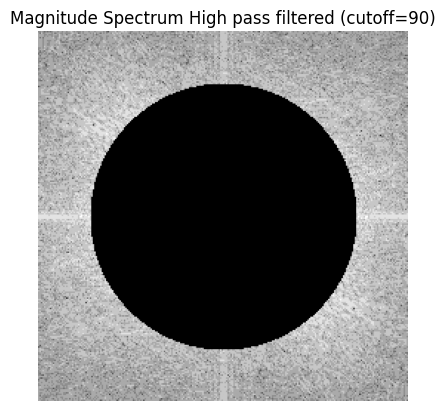

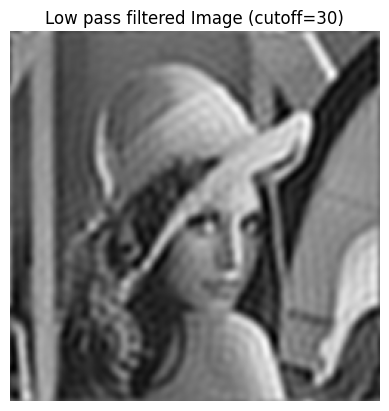

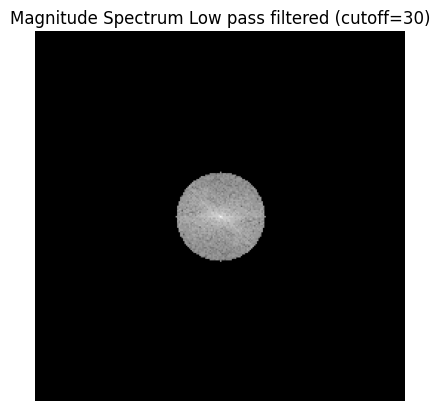

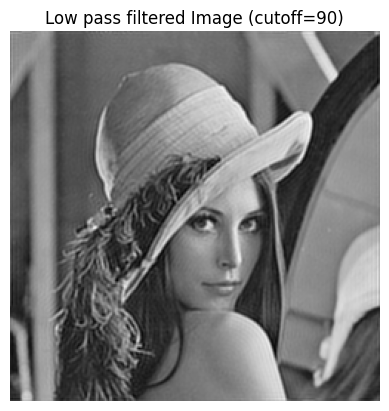

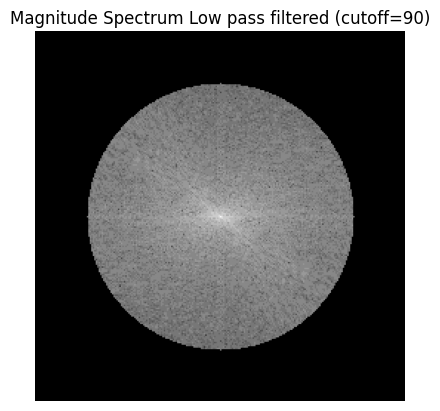

In [78]:
image = read_image("Lenna.png")
magnitude, phase = fourier_transform(image)

show_image("Original Image", image)
plot_fourier("Original", magnitude, None)

## Apply ideal high pass filter
cutoff_values = [30, 90]
for cutoff in cutoff_values:
    filtered_magnitude = ideal_high_pass_filter(magnitude, cutoff)
    filtered_phase = phase
    image_reconstructed = inverse_fourier_transform(filtered_magnitude, filtered_phase)
    show_image("High pass filtered Image (cutoff=" + str(cutoff) + ")", image_reconstructed)
    plot_fourier("High pass filtered (cutoff=" + str(cutoff) + ")", filtered_magnitude, None)

## Apply ideal low pass filter
cutoff_values = [30, 90]
for cutoff in cutoff_values:
    filtered_magnitude = ideal_low_pass_filter(magnitude, cutoff)
    filtered_phase = phase
    image_reconstructed = inverse_fourier_transform(filtered_magnitude, filtered_phase)
    show_image("Low pass filtered Image (cutoff=" + str(cutoff) + ")", image_reconstructed)
    plot_fourier("Low pass filtered (cutoff=" + str(cutoff) + ")", filtered_magnitude, None)

#### (c)  ¿Qu´e representa la fase de la transformada de Fourier de una imagen? ¿Qu´e ocurre si se conserva solo la fase o solo la magnitud? Ejercicio sugerido: Reconstruir una imagen usando solo la magnitud y fase de otra imagen, intercambiar fase y magnitud entre dos im´agenes distintas.

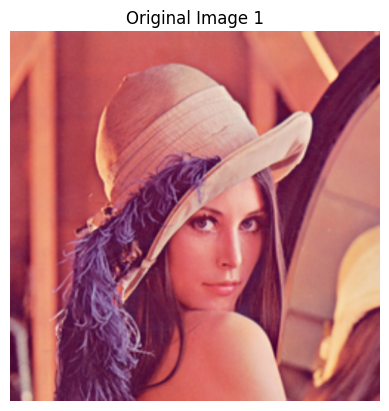

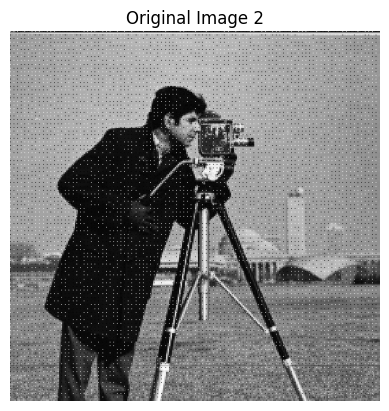

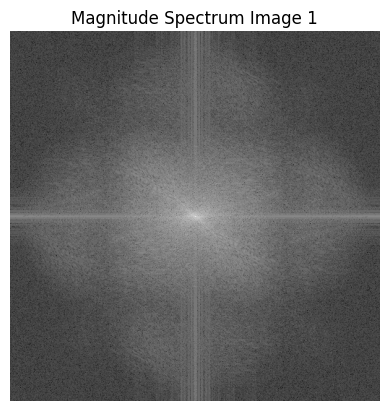

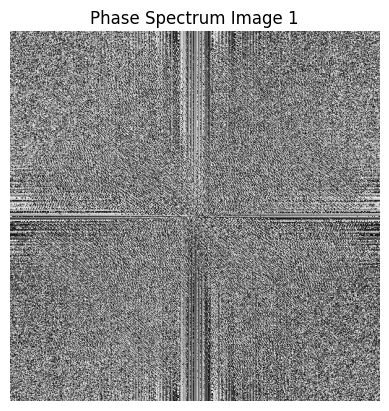

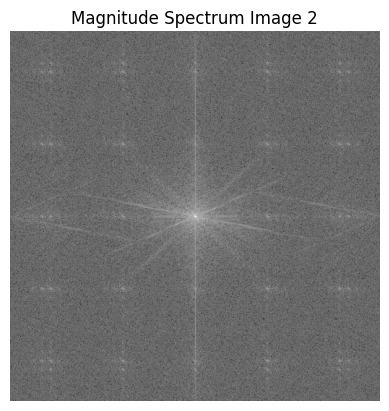

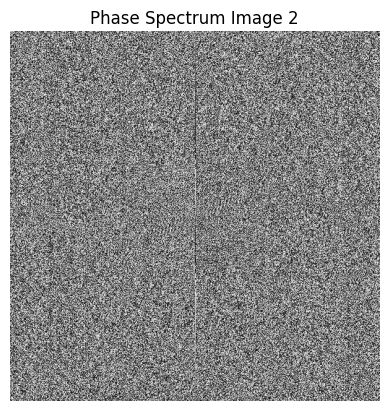

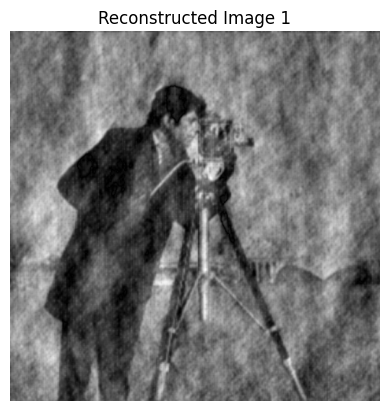

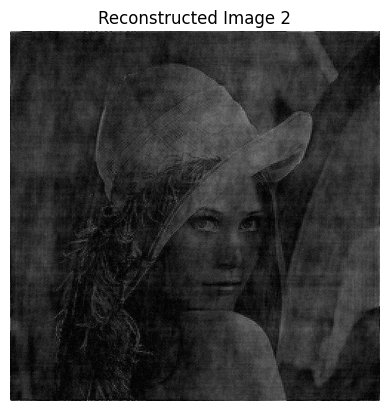

In [79]:
image_1 = read_image("Lenna.png")
image_2 = read_image("cameraman-salt-pepper.png")

## Adapt the images to the same size
image_1 = cv2.resize(image_1, (512, 512))
image_2 = cv2.resize(image_2, (512, 512))

magnitude_1, phase_1 = fourier_transform(image_1)
magnitude_2, phase_2 = fourier_transform(image_2)

show_image("Original Image 1", image_1)
show_image("Original Image 2", image_2)

plot_fourier("Image 1", magnitude_1, phase_1)
plot_fourier("Image 2", magnitude_2, phase_2)


# Swap the magnitude and phase of the two images
image_reconstructed_1 = inverse_fourier_transform(magnitude_1, phase_2)
image_reconstructed_2 = inverse_fourier_transform(magnitude_2, phase_1)

show_image("Reconstructed Image 1", image_reconstructed_1)
show_image("Reconstructed Image 2", image_reconstructed_2)

#### (d) ¿Por qu´e se centra la transformada de Fourier para su visualizaci´on? ¿Qu´e efecto tiene? Ejercicio sugerido: Mostrar el espectro de magnitud con y sin aplicar fftshift.

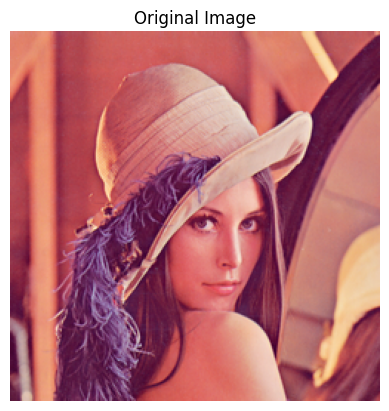

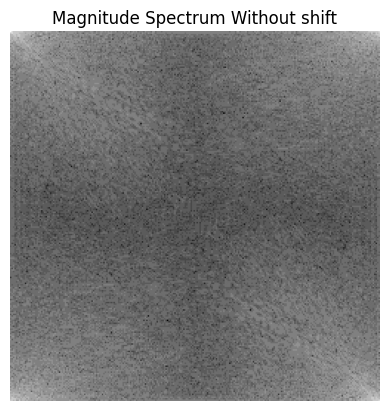

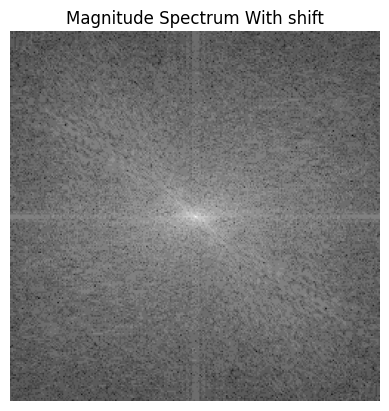

In [80]:
image  = read_image("Lenna.png")
show_image("Original Image", image)

## Plot without shift
magnitude, phase = fourier_transform(image, shift=False)
plot_fourier("Without shift", magnitude, None)

## Plot with shift
magnitude, phase = fourier_transform(image, shift=True)
plot_fourier("With shift", magnitude, None)


#### (e) ¿C´omo se comporta la transformada de Fourier ante la traslaci´on o rotaci´on de una imagen? Ejercicio sugerido: Aplicar una traslaci´on o rotaci´on y comparar los espectros de magnitud y fase antes y despu´es.

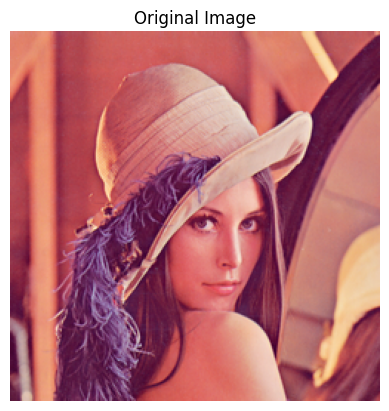

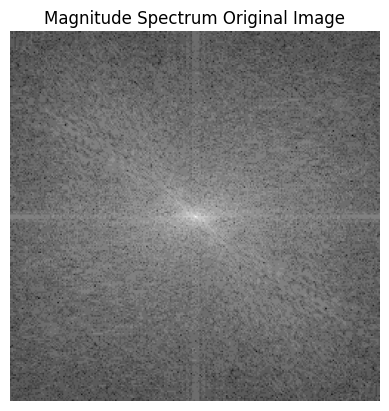

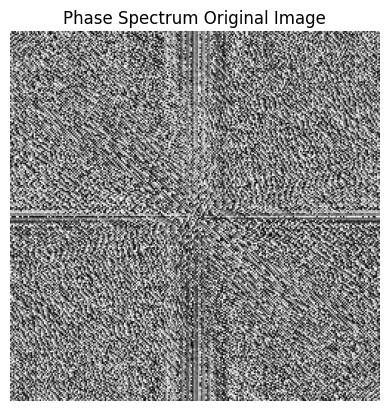

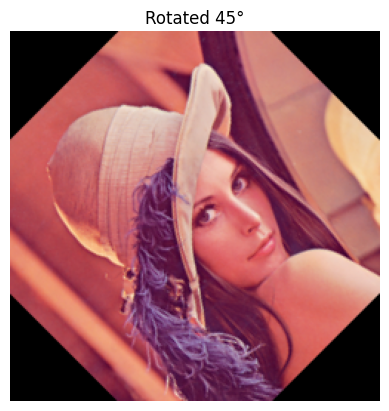

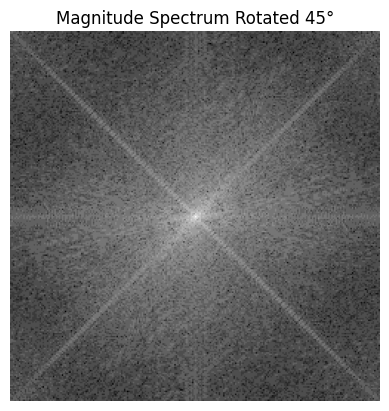

...

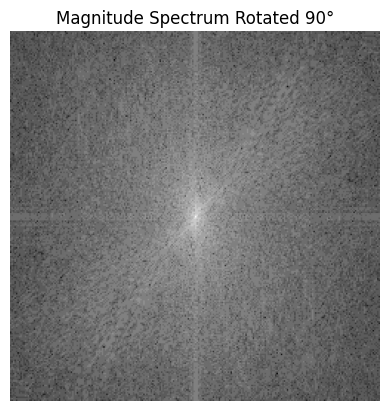

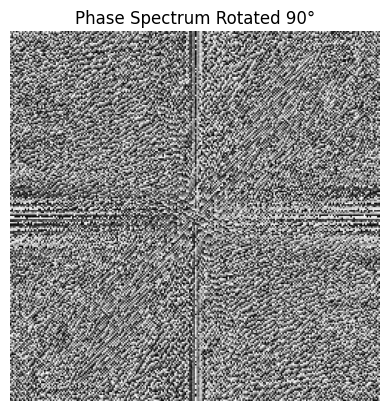

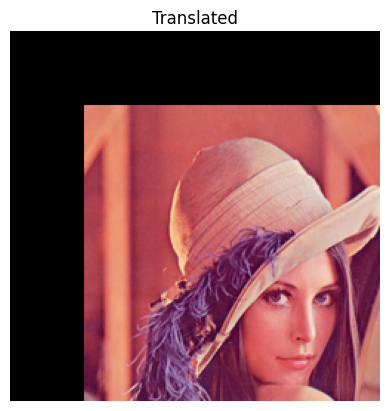

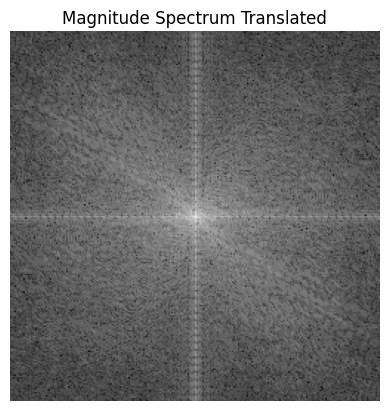

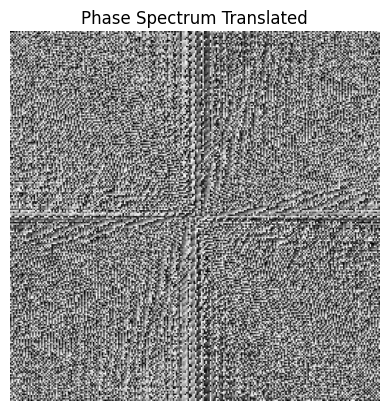

In [81]:
image_original = read_image("Lenna.png")

images_list = [
    {
        "image": image_original,
        "label": "Original Image",
    },
    {
        "label": "Rotated 45°",
        "image": cv2.warpAffine(
            image_original,
            cv2.getRotationMatrix2D((image_original.shape[1] / 2, image_original.shape[0] / 2), 45, 1),
            (image_original.shape[1], image_original.shape[0])
        ),
    },
    {
        "label": "Rotated 90°",
        "image": cv2.rotate(image_original, cv2.ROTATE_90_CLOCKWISE),
    },
    {
        "label": "Translated",
        "image": cv2.warpAffine(image_original, np.float32([[1, 0, 50], [0, 1, 50]]), (image_original.shape[1], image_original.shape[0])),
    }
]

for img in images_list:
    image = img["image"]
    label = img["label"]
    magnitude, phase = fourier_transform(image)
    show_image(label, image)
    plot_fourier(label, magnitude, phase)

#### (f) ¿C´omo se refleja una estructura peri´odica en el dominio frecuencial? Ejercicio sugerido: Usar im´agenes sint´eticas (rejillas, l´ıneas) y observar c´omo se representan sus frecuencias dominantes.

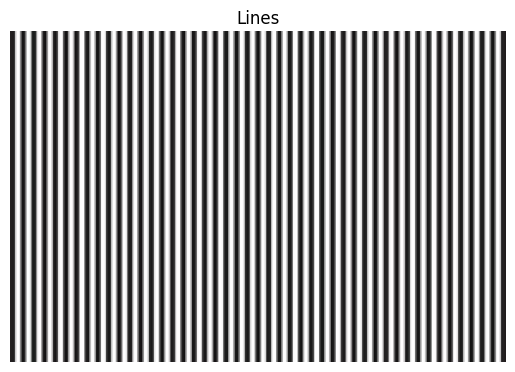

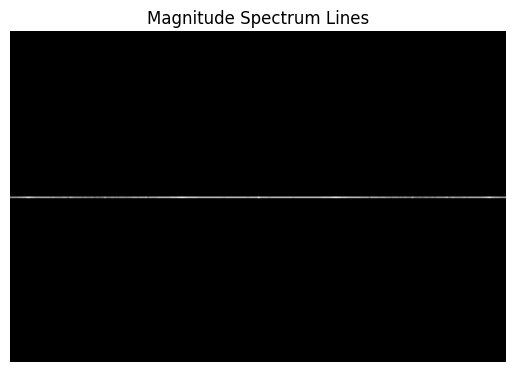

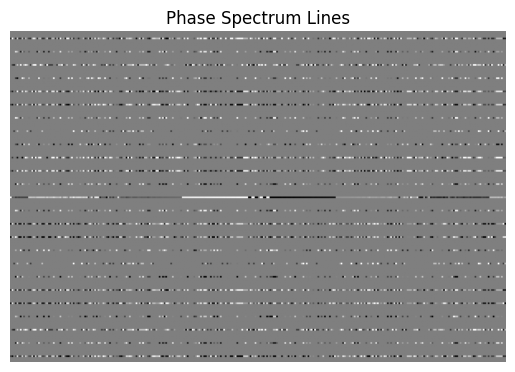

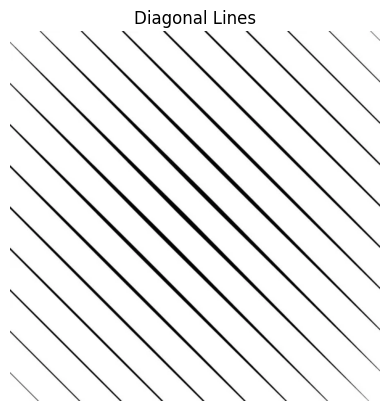

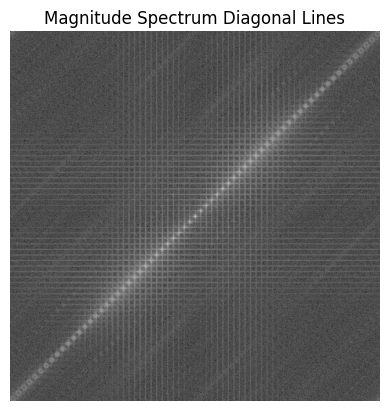

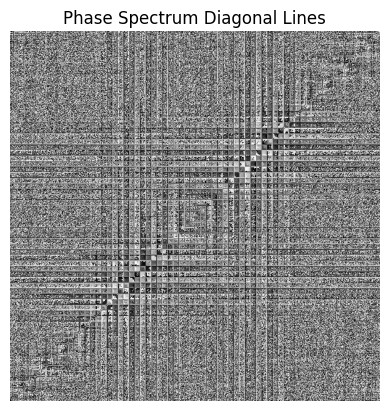

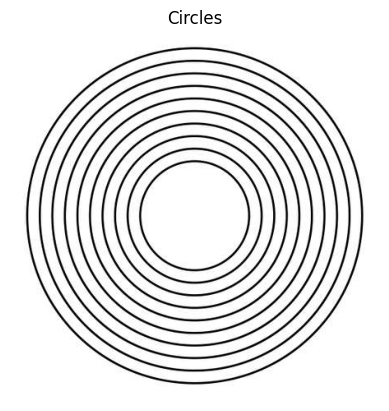

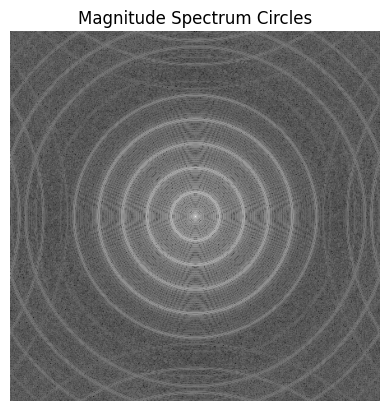

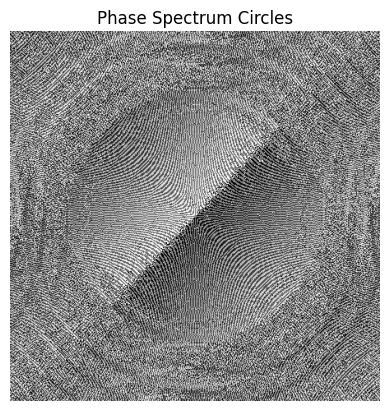

In [82]:
image = read_image("lines.png")
show_image("Lines", image)
magnitude, phase = fourier_transform(image)
plot_fourier("Lines", magnitude, phase)

image = read_image("diagonal-lines.png")
show_image("Diagonal Lines", image)
magnitude, phase = fourier_transform(image)
plot_fourier("Diagonal Lines", magnitude, phase)

image = read_image("circles.png")
show_image("Circles", image)
magnitude, phase = fourier_transform(image)
plot_fourier("Circles", magnitude, phase)

#### (g) ¿Qu´e diferencias se observan en el espectro de im´agenes suaves vs. im´agenes con bordes pronunciados? Ejercicio sugerido: Comparar el espectro de una imagen desenfocada vs. la original con bordes definidos.

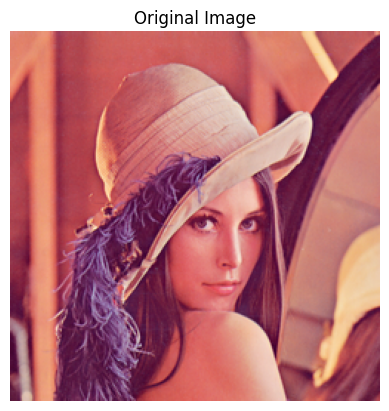

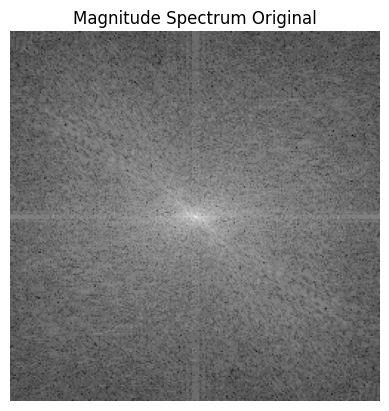

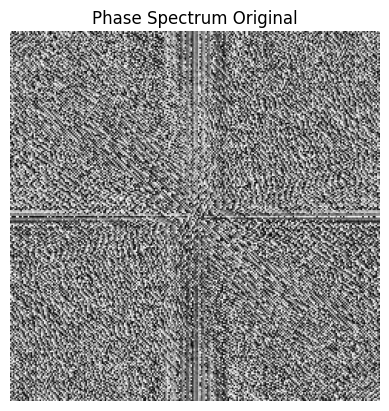

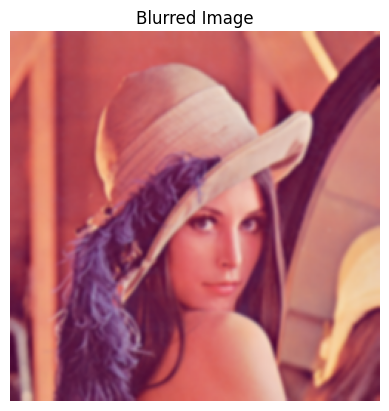

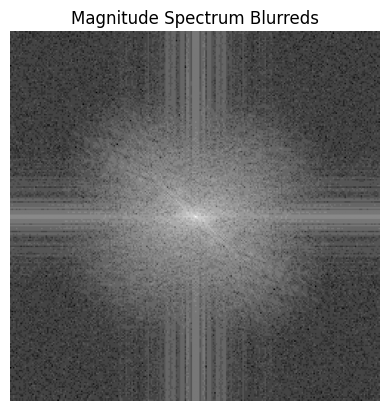

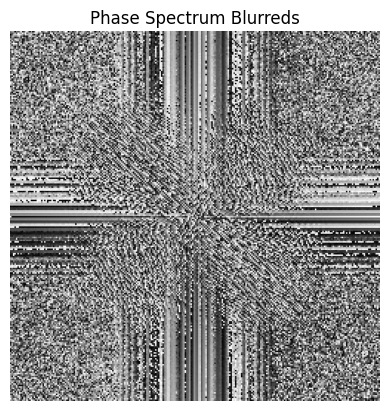

In [83]:
image = read_image("Lenna.png")
show_image("Original Image", image)
original_magnitude, original_phase = fourier_transform(image)
plot_fourier("Original", original_magnitude, original_phase)

blured_image = cv2.GaussianBlur(image, (5, 5), 0)
show_image("Blurred Image", blured_image)
blured_magnitude, blured_phase = fourier_transform(blured_image)
plot_fourier("Blurreds", blured_magnitude, blured_phase)


#### (h) ¿Qu´e ocurre si aplicamos un filtro de forma circular o rectangular en el espectro? ¿C´omo cambia la imagen? Ejercicio sugerido: Implementar m´ascaras ideales de paso bajo y paso alto circulares y cuadradas y observar sus efectos.

In [84]:
def sqare_low_pass_filter(magnitude, cutoff):
    # Create a square mask
    rows, cols = magnitude.shape
    center_row, center_col = rows // 2, cols // 2
    y, x = np.ogrid[:rows, :cols]
    mask = (np.abs(x - center_col) <= cutoff) & (np.abs(y - center_row) <= cutoff)

    # Apply the mask to the magnitude spectrum
    filtered_magnitude = magnitude * mask

    return filtered_magnitude

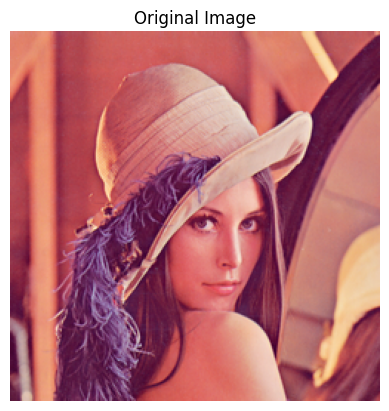

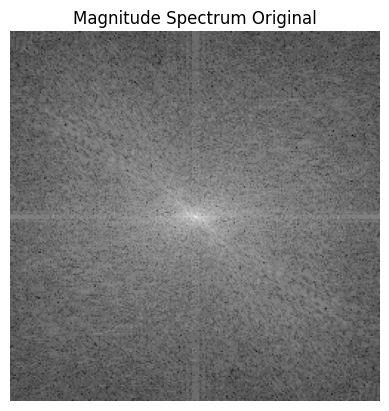

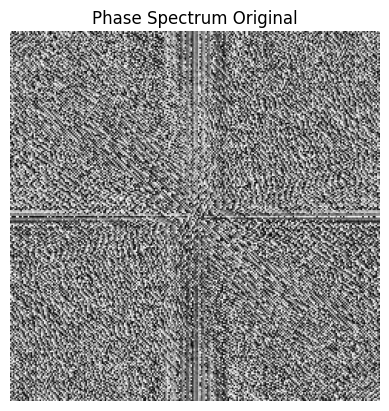

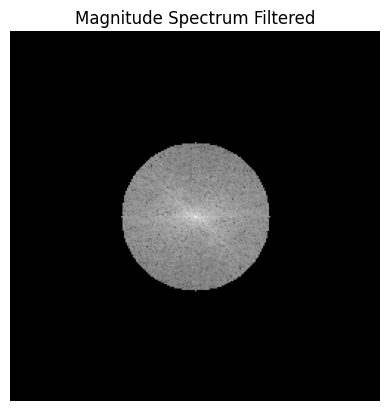

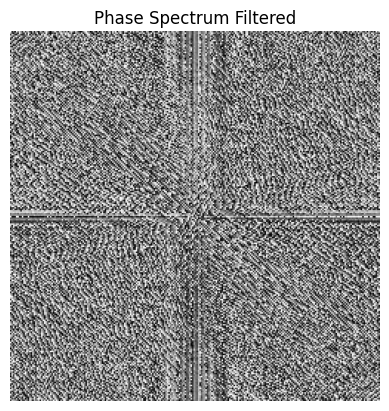

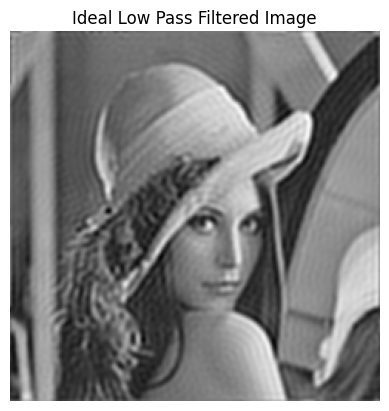

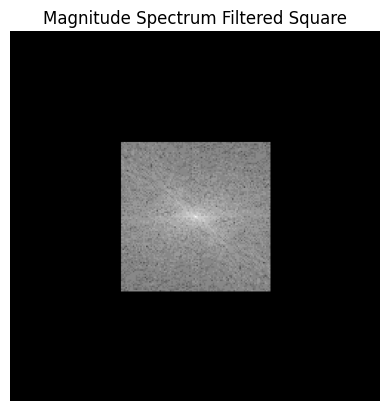

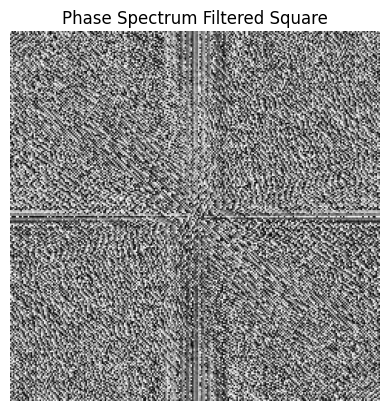

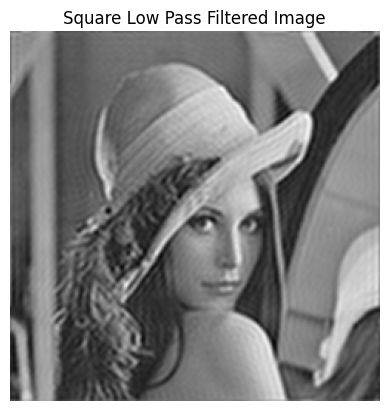

In [85]:
original_image = read_image("Lenna.png")
show_image("Original Image", original_image)
original_magnitude, original_phase = fourier_transform(original_image)
plot_fourier("Original", original_magnitude, original_phase)

## Apply ideal low pass filter
cutoff_value = 50

filtered_magnitude = ideal_low_pass_filter(original_magnitude, cutoff_value)
plot_fourier("Filtered", filtered_magnitude, original_phase)
image_reconstructed = inverse_fourier_transform(filtered_magnitude, original_phase)
show_image("Ideal Low Pass Filtered Image", image_reconstructed)

## Apply square low pass filter
filtered_magnitude_square = sqare_low_pass_filter(original_magnitude, cutoff_value)
plot_fourier("Filtered Square", filtered_magnitude_square, original_phase)
image_reconstructed_square = inverse_fourier_transform(filtered_magnitude_square, original_phase)
show_image("Square Low Pass Filtered Image", image_reconstructed_square)

#### (j) ¿C´omo puede usarse el dominio frecuencial para eliminar ruido peri´odico en una imagen? Ejercicio sugerido: Introducir ruido peri´odico artificialmente y dise˜nar un filtro para suprimirlo en el dominio de la frecuencia.

In [86]:
from scipy.signal import find_peaks

def gaussian_notch_filter(shape, centers, sigma=5):
    M, N = shape
    U, V = np.meshgrid(np.arange(N), np.arange(M))
    notch_mask = np.ones((M, N), dtype=np.float32)

    for (u0, v0) in centers:
        D2 = (V - u0)**2 + (U - v0)**2
        gaussian = np.exp(-D2 / (2 * sigma**2))
        notch_mask *= (1 - gaussian)

    return notch_mask

def remove_horizontal_noise(magnitude, phase, sigma=5, threshold_factor=2):
    M, N = magnitude.shape
    center_u, center_v = M // 2, N // 2

    # Projection over the vertical axis
    vertical_profile = magnitude[:, center_v].copy()
    vertical_profile[center_u - 5:center_u + 5] = 0  # Ignore the center frequency

    # Detect peakss
    threshold = vertical_profile.mean() + threshold_factor * vertical_profile.std()
    peaks, _ = find_peaks(vertical_profile, height=threshold)

    # Calculate the center of the peaks
    centers = [(u, center_v) for u in peaks] + [(M - u, center_v) for u in peaks]

    # Create the notch filter
    notch_mask = gaussian_notch_filter((M, N), centers, sigma=sigma)

    # Apply the notch filter to the magnitude spectrum
    filtered_magnitude = magnitude * notch_mask

    return filtered_magnitude, phase


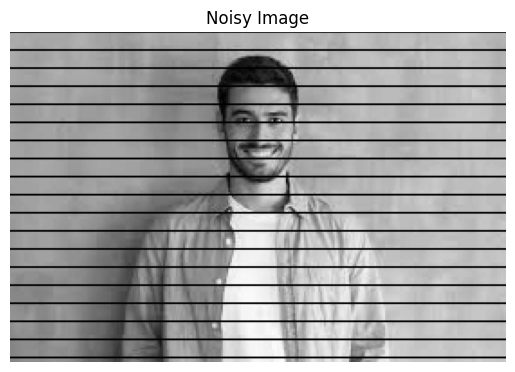

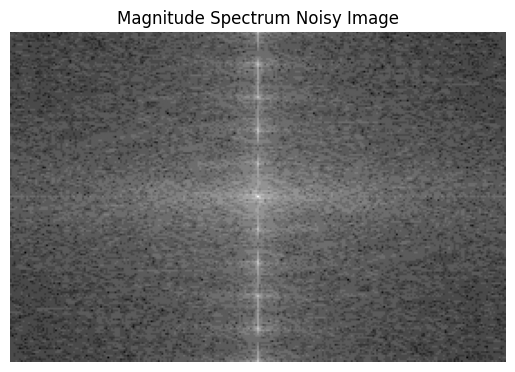

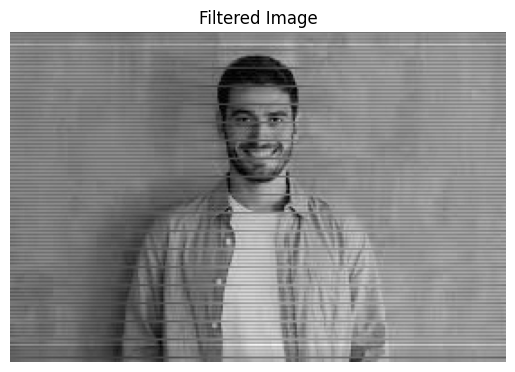

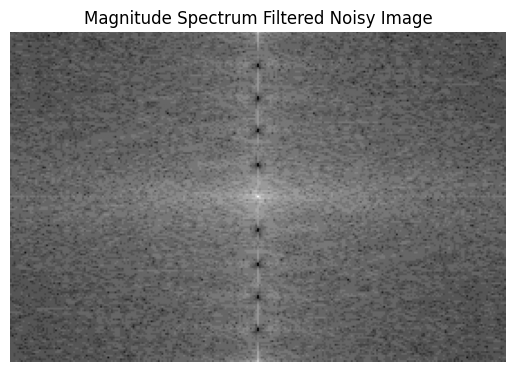

In [87]:


original_image = read_image("man.png")
original_magnitude, original_phase = fourier_transform(original_image)

## Add periodic noise
rows, cols = original_image.shape[:2]
noise = np.zeros((rows, cols), dtype=np.uint8)
for i in range(0, rows, 10):
    for j in range(0, cols, 1):
        noise[i:i+1, j:j+1] = 255

# Convert noise to a 3-channel image
noise_rgb = cv2.merge([noise, noise, noise])
noisy_image = cv2.addWeighted(original_image, 0.5, noise_rgb, -0.5, 0)

noisy_image = cv2.cvtColor(noisy_image, cv2.COLOR_BGR2GRAY)
show_image("Noisy Image", noisy_image)

magnitude, phase = fourier_transform(noisy_image)
plot_fourier("Noisy Image", magnitude, None)

# Remove horizontal noise
magnitude, phase = remove_horizontal_noise(magnitude, phase, sigma=3, threshold_factor=3)

image_reconstructed = inverse_fourier_transform(magnitude, phase)
show_image("Filtered Image", image_reconstructed)
plot_fourier("Filtered Noisy Image", magnitude, None)

